<a href="https://colab.research.google.com/github/InesAgudoMartin/APRENDIZAJE_AUTOMATICO_23_24/blob/main/PROCESAMIENTO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PRÁCTICA II: PROCESAMIENTO DE VÍDEO

*INTRODUCCIÓN:*


### CONFIGURACIÓN DEL ENTORNO

Configuramos las herramientas necesarias para cargar, procesar, visualizar y analizar videos e imágenes en Colab.

In [7]:
# Importamos bibliotecas
import cv2  #imágenes y vídeos
import numpy as np  #operaciones
import matplotlib.pyplot as plt  #visualización
from google.colab.patches import cv2_imshow #mostrar imágenes en colab
import time  #pausas

En cuánto a las bibliotecas utilizadas:

`matplotlib.pyplot` la hemos añadido para visualizar imágenes o gráficos dentro de Colab.

`cv2_imshow`, se trata de una versión adaptada de `cv2.imshow`, para mostrar imágenes en Colab, para el apartado en el que mostramos las 5 primeras imágenes del vídeo, es una manera de entender mejor la secuencia, tener más datos y poder ubicarnos al principio para el análisis posterior. Esta función implementada nos permite visualizar los 5 primeros fotogrmas de esta secuencia con la que trabajamos.

Por otro lado, hemos usado esta que es menos común, `time` para controlar pausas en la ejecución, es decir, refiriéndonos al mismo apartado del que hablábamos antes, para visualizar las primeras fotos, cuando queremos esperar entre una y otra.

**OPENCV**

OpenCV (Open Source Computer Vision Library) es una biblioteca diseñada para aplicaciones de procesamiento de imágenes y videos. Nos permite trabajar de manera sencilla con imágenes, videos, y aplciar ciertas técnicas como detección de objetos, seguimiento...

En esta práctica en concreto la utilizamos porque estamos trabajando con procesamiento de vídeo y nos permite leer videos desde archivos, modificar cada fotograma del vídeo (aplicar filtros, detectar bordes...), incluso guardar los vídeos en distintos formatos. Por otro lado, a la hora de aplicar técnicas que es en parte, de lo que se trata esta práctica, esta biblioteca permite aplicar muchas de ellas como:

Detección de bordes
Segmentación
Seguimiento de objetos
En el primero paso de cargar o preparar el vídeo, hemos utilizado funciones como cv2.VideoCapture para cargar el video y cv2.VideoWriter para guardar los resultados procesados.

Además, import cv2 lo usamos para cargar la biblioteca de OpenCV en el código. Una vez importada, podemos usar todas sus funciones para trabajar con imágenes y videos.

### PREPARACIÓN DEL VÍDEO
En este primer paso, hemos seleccionado un video en formato MP4 (como pide el enunciado), que dura más de 10 segundos y con un contenido lo suficientemente adecuado para poder aplicar técnicas de procesamiento.
Hemos cargado el video en el entorno de Colab, y hemos comprobado sus propiedades que es importante tenerlas en cuenta a la hora de realizar el proyecto.

Video cargado correctamente.
Resolución: 1920x1080
FPS: 25.0
Duración: 34 segundos


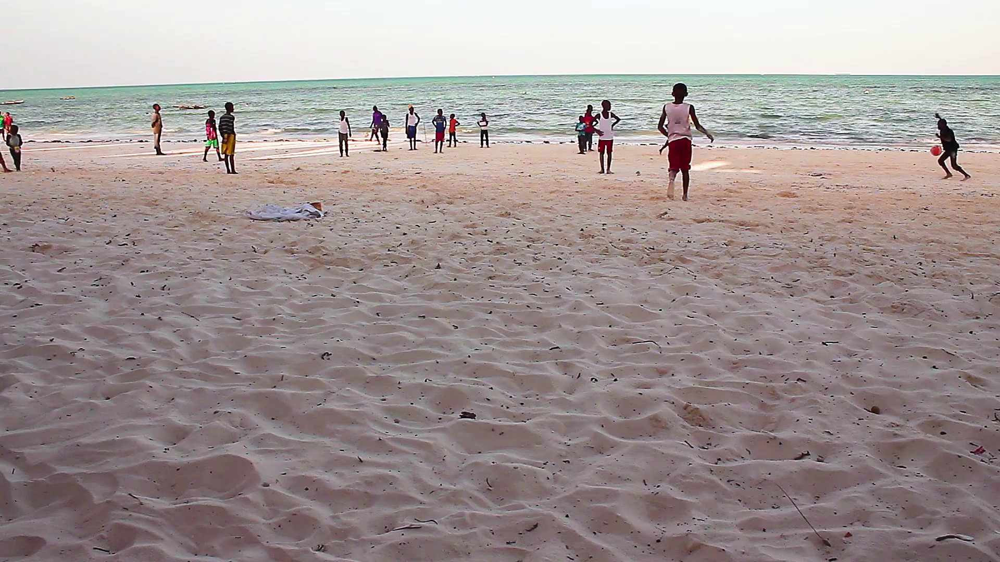

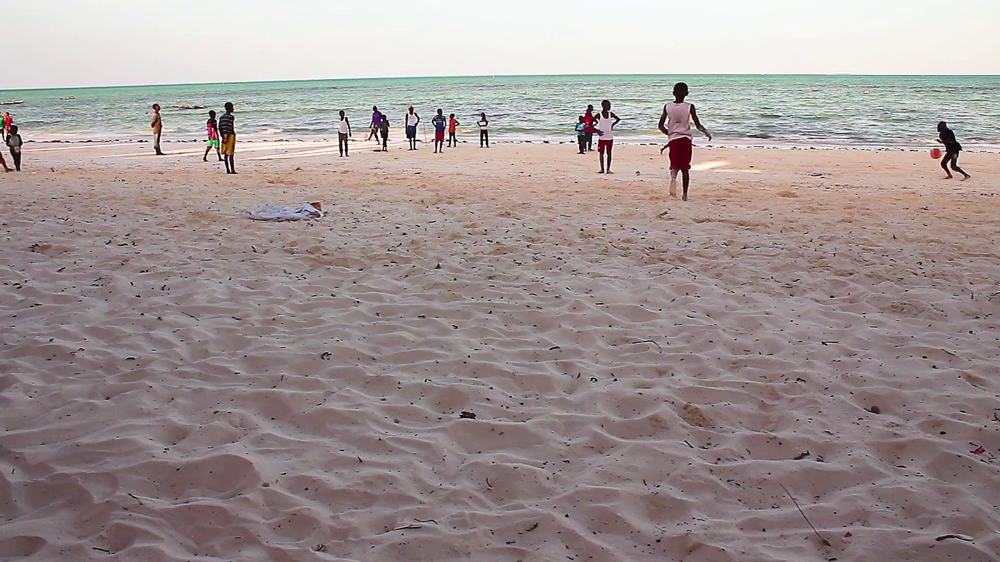

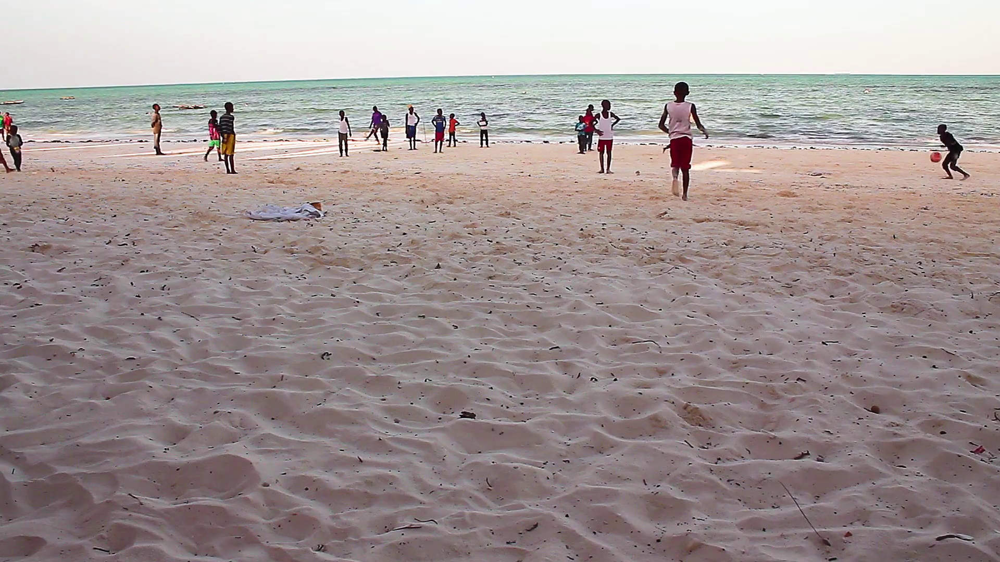

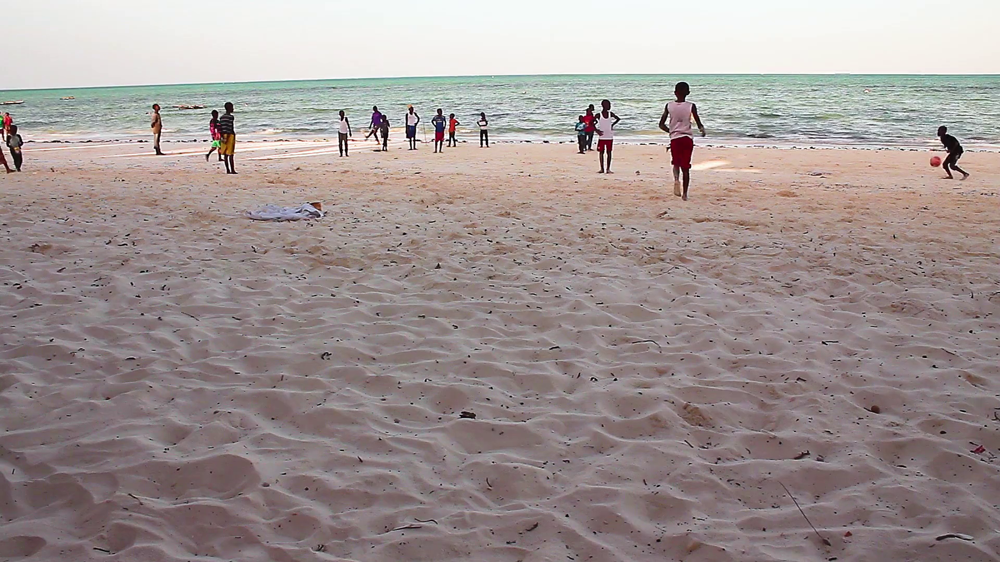

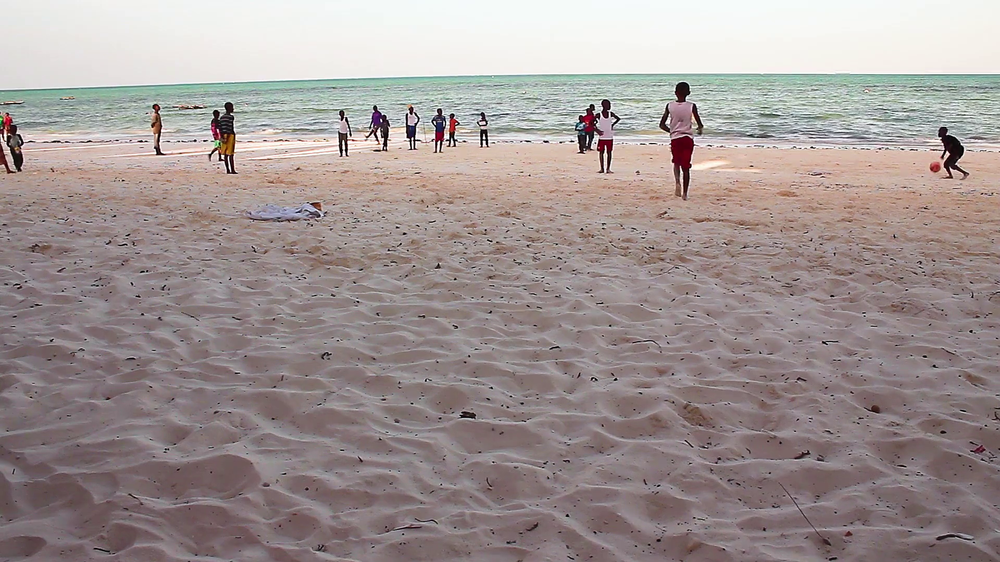

In [8]:
video_path = '6640000-hd_1920_1080_25fps.mp4'

#Cargamos el video con OpenCV
cap = cv2.VideoCapture(video_path)

# propiedades
if not cap.isOpened():
    print("Error al abrir video.")
else:
    print("Video cargado correctamente.")
    print(f"Resolución: {int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))}x{int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))}") #devuelve el alto y ancho del video
    print(f"FPS: {cap.get(cv2.CAP_PROP_FPS)}")
    #devuelve numero total de fotografías en el vídeo
    print(f"Duración: {int(cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS))} segundos")


    #visualizar las 5 primeras imágenes
    for i in range(5):
        ret, frame = cap.read()
        if not ret:
            print("Error al leer fotograma.")
            break
        cv2_imshow(frame)
        time.sleep(0.5)  # 0.5s entre fotogramas

cap.release()


Teniendo en cuenta los resultados obtenidos, que parecen típicos, algo que ya sabemos o que simplemente contienen todos los vídeos, pero es realmente importante conocer a qué se refiere o para qué nos sirve cada una de las propiedades de cara al análisis posterior.

En cuánto a la duración, que son 34s, nos indica el tiempo total que estará el vídeo en reproducción. Se considera buena ya que si fuese demasiado corto podría no proporcionar suficientes fotografías (recordamos que el vídeo es una secuencia de fotogramas) para aplicar las técnicas, mientras que uno muy largo resultaría incluso costoso de analizar.
La duración de un vídeo consiste en el número total de fotogramas entre los fotogramas por segundo (FPS).


También hemos visto que tiene una resolución de 1920x1080, que es el tamaño del vídeo en píxeles: en este caso 1920 de ancho y 1080 de alto.
Una resolución mucho más alta aunque nos daría más información visual y sería más fácil para aplicar características como detección de bordes, podría ralentizar el procesamiento porque necesita más datos por fotograma.


Como hemos nombrado antes, los FPS o fotogramas por segundo en este vídeo son 25, se refieren a las imágenes individuales que componen un segundo del vídeo (cada segundo esta compuesto por 25 imágenes).
Un FPS alto permite un movimiento más fluido, que nos podría interesar para técnicas como el seguimiento de objetos, porque no habrá "saltos" bruscos entre fotogramas.


### CONFIGURACIÓN ENTORNO PYTHON

In [9]:
# Importar bibliotecas necesarias
import cv2
import numpy as np
import os

# Función para mostrar las opciones de procesamiento
def mostrar_menu():
    print("\nOpciones de procesamiento:")
    print("1. Detección de bordes")
    print("2. Segmentación")
    print("3. Seguimiento de objetos")
    print("4. Salir")

# Función principal para la interfaz
def interfaz_usuario():
    # Mostrar mensaje de bienvenida
    print("Bienvenido al sistema de procesamiento de video.\n")

    # Solicitar al usuario la ruta del archivo de video
    video_path = input("Introduce la ruta del archivo de video (en formato .mp4): ")

    # Verificar si el archivo existe
    if not os.path.isfile(video_path):
        print("Error: El archivo no existe o la ruta es incorrecta.")
        return

    # Intentar cargar el video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error al abrir el video. Verifica que el archivo sea válido.")
        return

    print("Video cargado correctamente.")
    print(f"Resolución: {int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))}x{int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))}")
    print(f"FPS: {cap.get(cv2.CAP_PROP_FPS)}")
    print(f"Duración: {int(cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS))} segundos")

    # Mostrar opciones de procesamiento
    while True:
        mostrar_menu()
        opcion = input("Selecciona una opción de procesamiento (1-4): ")

        if opcion == '1':
            print("Has seleccionado: Detección de bordes.")
            # Aquí iría la función para detección de bordes
        elif opcion == '2':
            print("Has seleccionado: Segmentación.")
            # Aquí iría la función para segmentación
        elif opcion == '3':
            print("Has seleccionado: Seguimiento de objetos.")
            # Aquí iría la función para seguimiento de objetos
        elif opcion == '4':
            print("Saliendo del programa. ¡Hasta luego!")
            break
        else:
            print("Opción no válida. Por favor, selecciona una opción válida.")

    # Liberar recursos
    cap.release()

# Ejecutar la interfaz de usuario
interfaz_usuario()


Bienvenido al sistema de procesamiento de video.

Introduce la ruta del archivo de video (en formato .mp4): 6640000-hd_1920_1080_25fps.mp4
Video cargado correctamente.
Resolución: 1920x1080
FPS: 25.0
Duración: 34 segundos

Opciones de procesamiento:
1. Detección de bordes
2. Segmentación
3. Seguimiento de objetos
4. Salir
Selecciona una opción de procesamiento (1-4): 3
Has seleccionado: Seguimiento de objetos.

Opciones de procesamiento:
1. Detección de bordes
2. Segmentación
3. Seguimiento de objetos
4. Salir
Selecciona una opción de procesamiento (1-4): 2
Has seleccionado: Segmentación.

Opciones de procesamiento:
1. Detección de bordes
2. Segmentación
3. Seguimiento de objetos
4. Salir
Selecciona una opción de procesamiento (1-4): 1
Has seleccionado: Detección de bordes.

Opciones de procesamiento:
1. Detección de bordes
2. Segmentación
3. Seguimiento de objetos
4. Salir
Selecciona una opción de procesamiento (1-4): 4
Saliendo del programa. ¡Hasta luego!
